# Get Data List

In [1]:
import glob, os

In [3]:
os.chdir("FDDB-folds")

In [4]:
listtxt = []

for file in glob.glob("*.txt"):
    if listtxt == "None":
        listtxt = file
    else:
        listtxt.append(file)

In [5]:
listtxt.sort()
listtxt

['FDDB-fold-01.txt',
 'FDDB-fold-02.txt',
 'FDDB-fold-03.txt',
 'FDDB-fold-04.txt',
 'FDDB-fold-05.txt',
 'FDDB-fold-06.txt',
 'FDDB-fold-07.txt',
 'FDDB-fold-08.txt',
 'FDDB-fold-09.txt',
 'FDDB-fold-10.txt']

In [6]:
alllist = []

for file in listtxt:
    f = open(file, 'r')
    while True:
        line = f.readline()
        line = line.replace("\n", "")
        print(line)
        if alllist == "None":
            alllist = line
        else:
            alllist.append(line)
        if not line:
            alllist.pop()
            break

2002/08/11/big/img_591
2002/08/26/big/img_265
2002/07/19/big/img_423
2002/08/24/big/img_490
2002/08/31/big/img_17676
2002/07/31/big/img_228
2002/07/24/big/img_402
2002/08/04/big/img_769
2002/07/19/big/img_581
2002/08/13/big/img_723
2002/08/12/big/img_821
2003/01/17/big/img_610
2002/08/13/big/img_1116
2002/08/28/big/img_19238
2002/08/21/big/img_660
2002/08/14/big/img_607
2002/08/05/big/img_3708
2002/08/19/big/img_511
2002/08/07/big/img_1316
2002/07/25/big/img_1047
2002/07/23/big/img_474
2002/07/27/big/img_970
2002/09/02/big/img_15752
2002/09/01/big/img_16378
2002/09/01/big/img_16189
2002/08/26/big/img_276
2002/07/24/big/img_518
2002/08/14/big/img_1027
2002/08/24/big/img_733
2002/08/15/big/img_249
2003/01/15/big/img_1371
2002/08/07/big/img_1348
2003/01/01/big/img_331
2002/08/23/big/img_536
2002/07/30/big/img_224
2002/08/10/big/img_763
2002/08/21/big/img_293
2002/08/15/big/img_1211
2002/08/15/big/img_1194
2003/01/15/big/img_390
2002/08/06/big/img_2893
2002/08/17/big/img_691
2002/08/07/big

In [7]:
len(alllist)

2845

# Get Annotations

In [8]:
os.chdir("../face-yolo/Annotations")

FileNotFoundError: [Errno 2] No such file or directory: '../face-yolo/Annotations'

In [8]:
def parse(line):
        x = line.split('>')[1].split('<')[0]
        try:
                r = int(x)
        except:
                r = x
        return r

In [9]:
os.chdir("../Annotations")

In [30]:
import cv2
import matplotlib.patches as patches
from PIL import Image
from matplotlib import pyplot as plt

/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


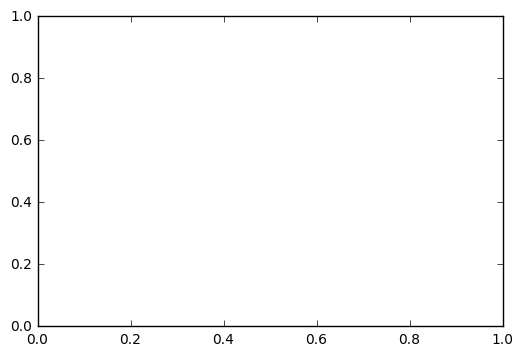

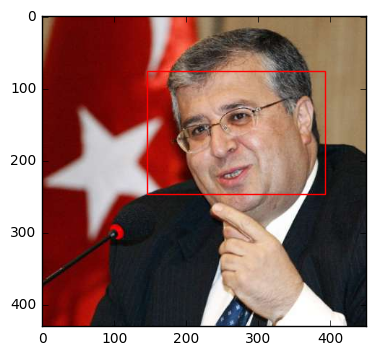

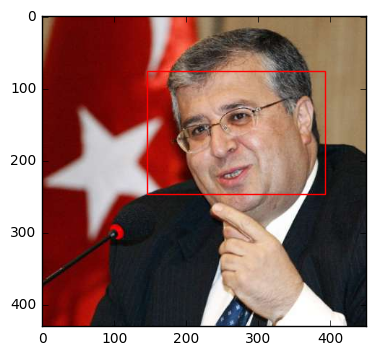

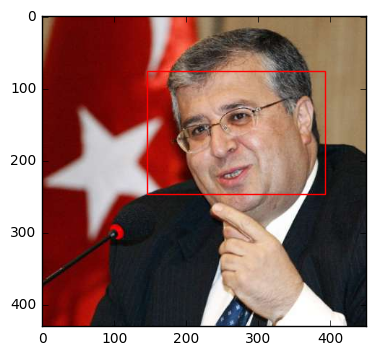

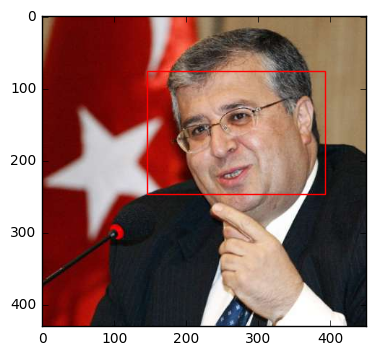

...

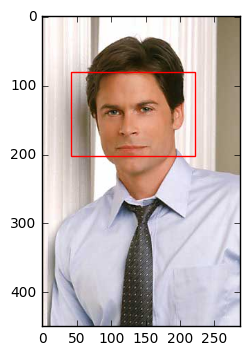

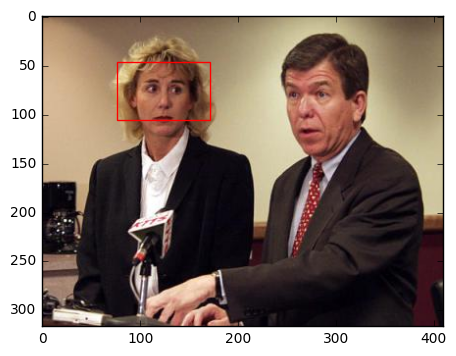

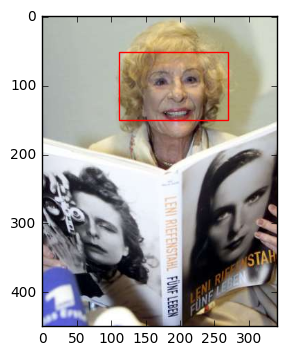

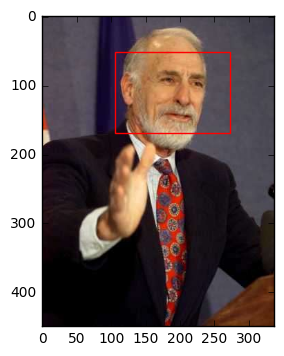

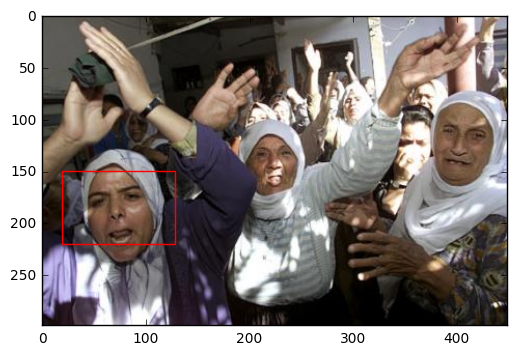

In [ ]:
num = 0

for annfile in alllist:
    annfile = annfile.replace("/", "-") + ".xml"
    jpgfile = annfile.replace(".xml", ".jpg")
    jpgfile = jpgfile.replace("-", "/")

    f = open(annfile, 'r')
    
    for i in range(0, 15):
        current = [None, None, None, None]
        line = f.readline()
        line = line.replace("\n", "")
        #print(line)

        xn = '<xmin>' in line
        if xn: 
            current[0] = parse(line)
            xmin = parse(line)
            #print("xmin:", current[0])
            
        xx = '<xmax>' in line
        if xx: 
            current[2] = parse(line)
            xmax = parse(line)
            #print("xmax:", current[2])
        
        yn = '<ymin>' in line
        if yn: 
            current[1] = parse(line)
            ymin = parse(line)
            #print("ymin:", current[1])
        
        yx = '<ymax>' in line
        if yx:
            current[3] = parse(line)
            ymax = parse(line)
            #print("ymax:", current[3])
            
    #print(xmin, ymin, xmax, ymax)
                
    #break
        
    image = cv2.imread("/home/deepcheck/Workspace/tmfdk333/face-yolo/data/"+jpgfile)
    face = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # plt.imshow(image)
        
    rect = patches.Rectangle((xmin, ymin), (xmax-xmin), (ymax-ymin), linewidth=1,edgecolor='r',facecolor='none')
    fig,ax = plt.subplots(1)
    ax.imshow(face)
    ax.add_patch(rect)
    output = jpgfile.replace("/", "-")
    plt.savefig('/home/deepcheck/Workspace/tmfdk333/face-yolo/output/'+output)
    plt.show()
    break
    #num += 1
    #print(num)

# Test Whale BBox

In [29]:
import matplotlib.patches as patches

In [ ]:
image1 = cv2.imread("/home/deepcheck/Workspace/tmfdk333/face-yolo/w_7489.jpg")
whale = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

In [ ]:
from PIL import Image
from matplotlib import pyplot as plt

plt.imshow(whale)
plt.show()

In [ ]:
Xmin = 1340
Ymin = 1226
Xmax = 1687
Ymax = 1444

bbox = [Xmin, Ymin, Xmax, Ymax]

In [ ]:
rect = patches.Rectangle((Xmin, Ymin), (Xmax-Xmin), (Ymax-Ymin), linewidth=1,edgecolor='r',facecolor='none')
fig,ax = plt.subplots(1)
ax.imshow(whale)
ax.add_patch(rect)
plt.savefig('output.jpg')


cv2.imread('output.jpg')
plt.show()
#cv2.imwrite('output.png', output_im)
#output_image = cv2.imread('output.png')